# Chapter 6 Matrix Decomposition

In [1]:
import copy
import japanize_matplotlib
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import scipy
from matplotlib.pyplot import imshow
from numpy.random import randn
from scipy import stats

C:\Users\prof-\anaconda3\lib\site-packages\japanize_matplotlib\japanize_matplotlib.py:15: MatplotlibDeprecationWarning: 
The createFontList function was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use FontManager.addfont instead.
  font_list = font_manager.createFontList(font_files)


## 6.1 Singular Decomposition

In [2]:
Z = np.array([0, 5, -1, -2, -4, 1]).reshape(-1, 3).T
print(Z)

[[ 0 -2]
 [ 5 -4]
 [-1  1]]


In [3]:
u, s, vh = np.linalg.svd(Z)
print("u:", u, "\n" "s:", s, "\n" "vh:", vh)

u: [[-0.19874421  0.97518046  0.09759001]
 [-0.95700744 -0.2145729   0.19518001]
 [ 0.21127591 -0.05460347  0.97590007]] 
s: [6.68193729 1.53352992] 
vh: [[-0.74773421  0.66399816]
 [-0.66399816 -0.74773421]]


In [4]:
u2, s2, vh2 = np.linalg.svd(Z.T)
print("u2:", u2, "\n" "s2:", s2, "\n" "vh2:", vh2)

u2: [[-0.74773421  0.66399816]
 [ 0.66399816  0.74773421]] 
s2: [6.68193729 1.53352992] 
vh2: [[-0.19874421 -0.95700744  0.21127591]
 [-0.97518046  0.2145729   0.05460347]
 [ 0.09759001  0.19518001  0.97590007]]


In [5]:
Z = np.array([0, 5, 5, -1]).reshape(-1, 2).T; print(Z)

[[ 0  5]
 [ 5 -1]]


In [6]:
u3, s3, vh3 = np.linalg.svd(Z.T)
print("u3:", u3, "\n" "s3:", s3, "\n" "vh3:", vh3)

u3: [[ 0.67100532 -0.74145253]
 [-0.74145253 -0.67100532]] 
s3: [5.52493781 4.52493781] 
vh3: [[-0.67100532  0.74145253]
 [-0.74145253 -0.67100532]]


In [7]:
val, vec = np.linalg.eig(Z)
print("values:", val, "\n" "vectors:", vec)

values: [ 4.52493781 -5.52493781] 
vectors: [[ 0.74145253 -0.67100532]
 [ 0.67100532  0.74145253]]


## 6.2 Exkart-Young's Theorem

In [8]:
def svd_r(z, r):
    u, s, vh = np.linalg.svd(z)
    sigma = np.zeros((z.shape[0], z.shape[1]))
    for i in range(r):
        sigma[i, i] = s[i]
    tt = np.dot(np.dot(u, sigma), vh)
    return tt

(80,)


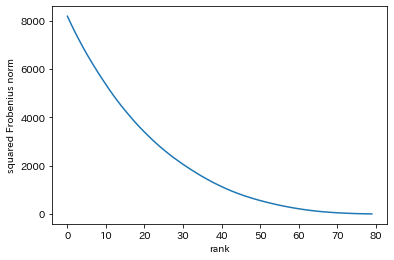

In [9]:
m = 100; n = 80; z = np.random.normal(size=m*n).reshape(m, -1)
F_norm = list()
for r in range(n):
    m = svd_r(z, r)
    F_norm.append(np.linalg.norm(z-m, ord="fro") ** 2)
print(np.array(F_norm).shape)
plt.plot(list(range(n)), F_norm)
plt.xlabel("rank")
plt.ylabel("squared Frobenius norm")
plt.show()

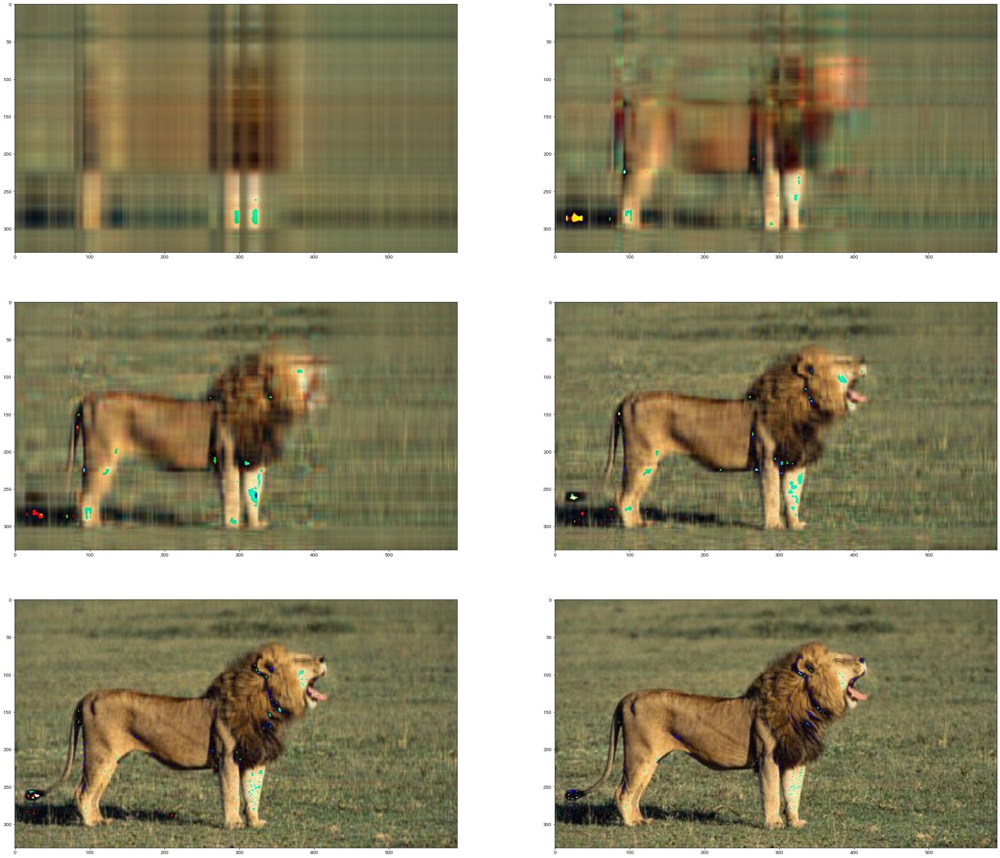

In [10]:
from PIL import Image
image = np.array(Image.open("lion.jpg"))
rank_seq = [2, 5, 10, 20, 50, 100]
mat = np.zeros((image.shape[0], image.shape[1], 3))
fig = plt.figure(figsize=(40, 35)); k = 1
for j in rank_seq:
    for i in range(3): mat[:, :, i] = svd_r(image[:, :, i], j)
    Image.fromarray(np.uint8(mat)).save("compressed/lion_compressed_mat_rank_%d.jpg" % j)
    Im = Image.open("compressed/lion_compressed_mat_rank_%d.jpg" % j)
    fig.add_subplot(3, 2, k)
    imshow(Im)
    k = k + 1

In [11]:
def mat_r(z, mask, r):
    min = np.inf
    m = z.shape[0]; n = z.shape[1]
    for j in range(5):
        guess = np.random.normal(size=m*n).reshape(m, -1)
        for i in range(10):
            guess = svd_r(mask * z + (1 - mask) * guess, r)
        value = np.linalg.norm(mask * (z - guess), ord="fro")
        if value < min: min_mat = guess; min = value
    return min_mat

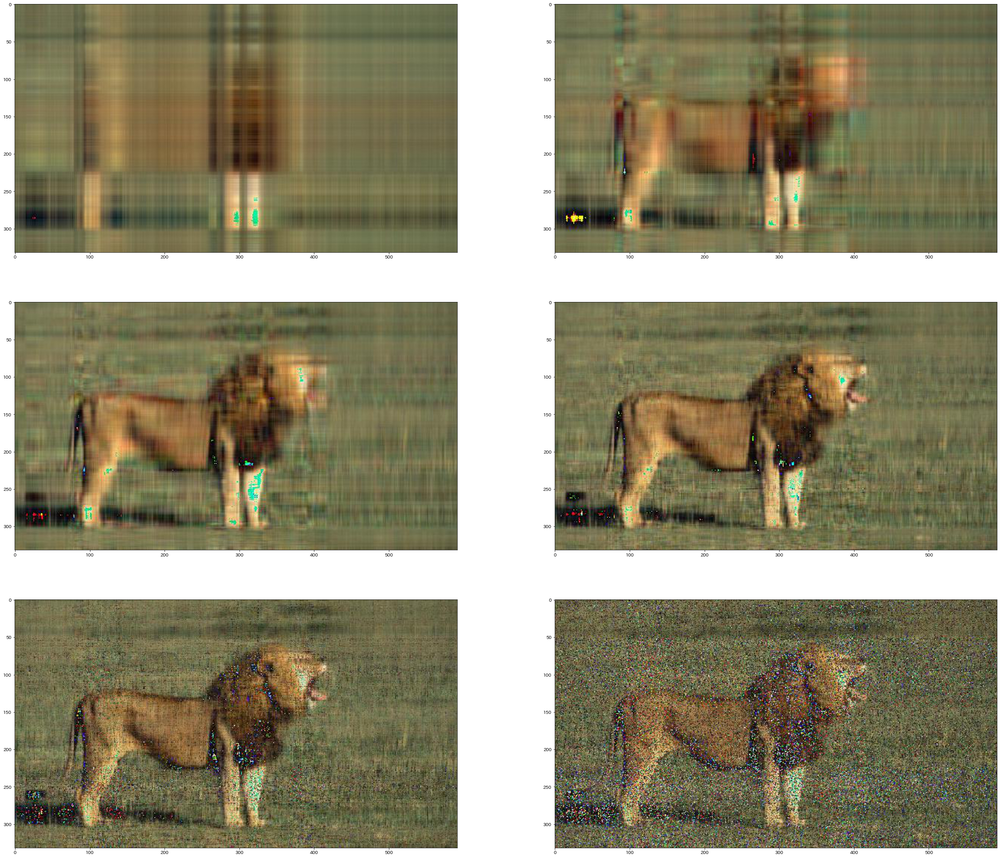

In [12]:
image = np.array(Image.open("lion.jpg"))
m = image.shape[0]; n = image.shape[1]
mask = np.random.binomial(1, 0.5, size=m*n).reshape(m, -1)
rank_seq = [2, 5, 10, 20, 50, 100]
fig = plt.figure(figsize=(40, 35)); k = 1
mat = np.zeros((image.shape[0], image.shape[1], 3))
for j in rank_seq:
    for i in range(3): mat[:, :, i] = mat_r(image[:, :, i], mask, j)
    Image.fromarray(np.uint8(mat)).save("compressed/lion2_compressed_mat_rank_%d.jpg" % j)
    Im = Image.open("compressed/lion2_compressed_mat_rank_%d.jpg" % j)
    fig.add_subplot(3, 2, k)
    imshow(Im)
    k = k + 1

## 6.3 Norm

## 6.4 Sparse Estimation for Low-Rank Estimation

In [13]:
def soft_svd(lambd, z):
    u, s, vh = np.linalg.svd(z)
    sigma = np.zeros((z.shape[0], z.shape[1]))
    for i in range(r):
        sigma[i, i] = s[i]
    return np.dot(np.dot(u, sigma), vh)

In [15]:
def mat_lasso(lambd, z, mask):
    m = z.shape[0]; n = z.shape[1]
    guess = np.random.normal(size=m*n).reshape(m, -1)
    for i in range(20):
        guess = soft_svd(lambd, mask * z + (1-mask) * guess)
    return guess

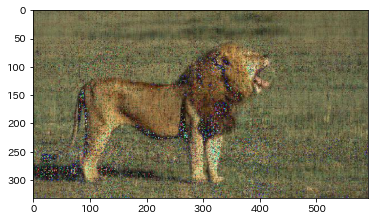

In [16]:
image = np.array(Image.open("lion.jpg"))
m = image[:, :, 1].shape[0]; n = image[:, :, 1].shape[1]
p = 0.5; lambd = 0.5
mat = np.zeros((m, n, 3))
mask = np.random.binomial(1, p, size=m*n).reshape(-1, n)
for i in range(3):
    mat[:, :, i] = mat_lasso(lambd, image[:, :, i], mask)
Image.fromarray(np.uint8(mat)).save("compressed/lion3_compressed_mat_soft.jpg")
i = Image.open("compressed/lion3_compressed_mat_soft.jpg")
imshow(i)